importing all libraries and storing the data set in df

In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 
from sklearn.preprocessing import QuantileTransformer
from scipy.stats import skew
from sklearn.model_selection import train_test_split
import warnings 
warnings.filterwarnings('ignore')
import os
from sklearn.model_selection import RepeatedStratifiedKFold
#naive bayes
from sklearn.naive_bayes import GaussianNB
#Decision tree
from sklearn.tree import DecisionTreeClassifier
#KNN
from sklearn.neighbors import KNeighborsClassifier
#SVM
from sklearn.svm import SVC
#Random forest
from sklearn.ensemble import RandomForestClassifier
import lime
from lime import lime_tabular


from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import f1_score, precision_score, recall_score,roc_curve,accuracy_score,auc


df=pd.read_csv("diabetes.csv")        

In [2]:
df.head(10)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
5,5,116,74,0,0,25.6,0.201,30,0
6,3,78,50,32,88,31.0,0.248,26,1
7,10,115,0,0,0,35.3,0.134,29,0
8,2,197,70,45,543,30.5,0.158,53,1
9,8,125,96,0,0,0.0,0.232,54,1


looking at the values of each column to check what you will need to clean up such as glucose cannot be 0 similiary with bloodpressure  skinthickness insulin and BMI

In [3]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


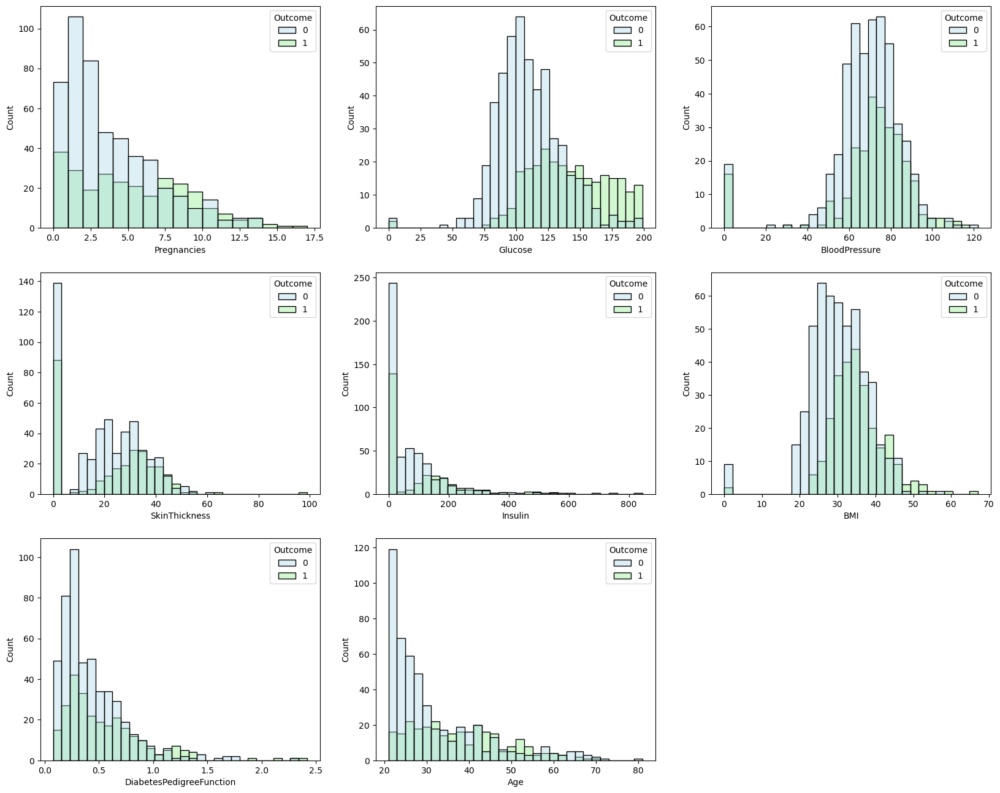

In [4]:


colors = ["lightblue", "lightgreen"]

plt.figure(figsize=(20,16))

plt.subplot(3,3,1)
sns.histplot(df, x="Pregnancies", hue="Outcome", bins=17, stat="count", palette=colors, alpha=0.4)

plt.subplot(3,3,2)
sns.histplot(df, x="Glucose", hue="Outcome", bins=30, stat="count", palette=colors, alpha=0.4)


plt.subplot(3,3,3)
sns.histplot(df, x="BloodPressure", hue="Outcome", bins=30, stat="count", palette=colors, alpha=0.4)

plt.subplot(3,3,4)
sns.histplot(df, x="SkinThickness", hue="Outcome", bins=30, stat="count", palette=colors, alpha=0.4)

plt.subplot(3,3,5)
sns.histplot(df, x="Insulin", hue="Outcome", bins=30, stat="count", palette=colors, alpha=0.4)

plt.subplot(3,3,6)
sns.histplot(df, x="BMI", hue="Outcome", bins=30, stat="count", palette=colors, alpha=0.4)

plt.subplot(3,3,7)
sns.histplot(df, x="DiabetesPedigreeFunction", hue="Outcome", bins=30, stat="count", palette=colors, alpha=0.4)

plt.subplot(3,3,8)
sns.histplot(df, x="Age", hue="Outcome", bins=30, stat="count", palette=colors, alpha=0.4)


plt.show()


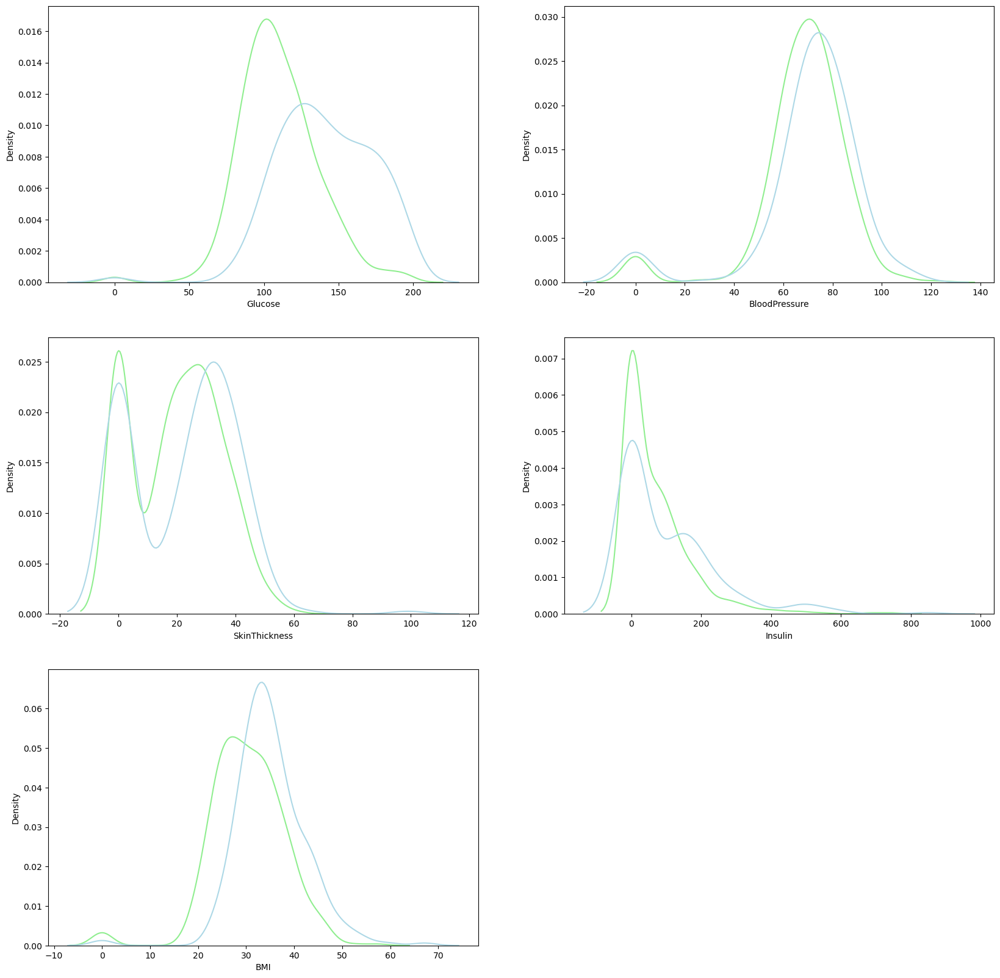

In [5]:

plt.figure(figsize=(20,20))

plt.subplot(3,2,1)
ax = sns.distplot(df[df['Outcome'] == 0]['Glucose'], color='lightgreen', hist=False, kde=True)
ax = sns.distplot(df[df['Outcome'] == 1]['Glucose'], color='lightblue', hist=False, kde=True)

plt.subplot(3,2,2)
ax = sns.distplot(df[df['Outcome'] == 0]['BloodPressure'], color='lightgreen', hist=False, kde=True)
ax = sns.distplot(df[df['Outcome'] == 1]['BloodPressure'], color='lightblue', hist=False, kde=True)

plt.subplot(3,2,3)
ax = sns.distplot(df[df['Outcome'] == 0]['SkinThickness'], color='lightgreen', hist=False, kde=True)
ax = sns.distplot(df[df['Outcome'] == 1]['SkinThickness'], color='lightblue', hist=False, kde=True)

plt.subplot(3,2,4)
ax = sns.distplot(df[df['Outcome'] == 0]['Insulin'], color='lightgreen', hist=False, kde=True)
ax = sns.distplot(df[df['Outcome'] == 1]['Insulin'], color='lightblue', hist=False, kde=True)
plt.subplot(3,2,5)
ax = sns.distplot(df[df['Outcome'] == 0]['BMI'], color='lightgreen', hist=False, kde=True)
ax = sns.distplot(df[df['Outcome'] == 1]['BMI'], color='lightblue', hist=False, kde=True)

plt.show()


<Axes: xlabel='DiabetesPedigreeFunction'>

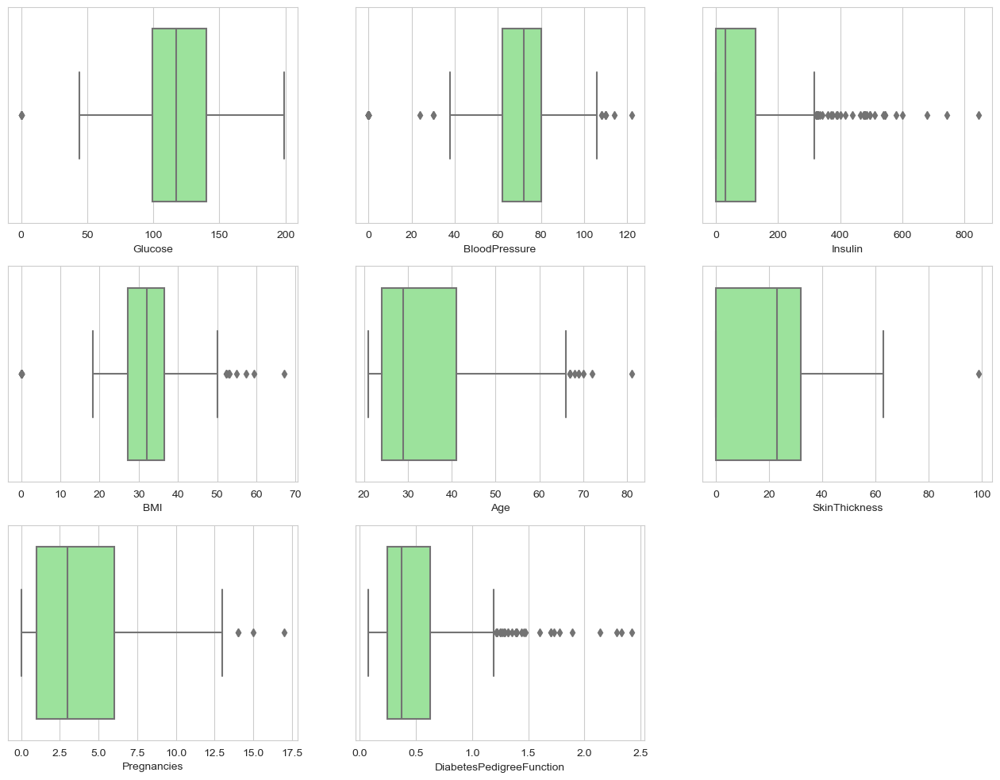

In [6]:
plt.figure(figsize=(16,12))
sns.set_style(style='whitegrid')
plt.subplot(3,3,1)
sns.boxplot(x='Glucose',data=df,color="lightgreen")
plt.subplot(3,3,2)
sns.boxplot(x='BloodPressure',data=df,color="lightgreen")
plt.subplot(3,3,3)
sns.boxplot(x='Insulin',data=df,color="lightgreen")
plt.subplot(3,3,4)
sns.boxplot(x='BMI',data=df,color="lightgreen")
plt.subplot(3,3,5)
sns.boxplot(x='Age',data=df,color="lightgreen")
plt.subplot(3,3,6)
sns.boxplot(x='SkinThickness',data=df,color="lightgreen")
plt.subplot(3,3,7)
sns.boxplot(x='Pregnancies',data=df,color="lightgreen")
plt.subplot(3,3,8)
sns.boxplot(x='DiabetesPedigreeFunction',data=df,color="lightgreen")


<Axes: >

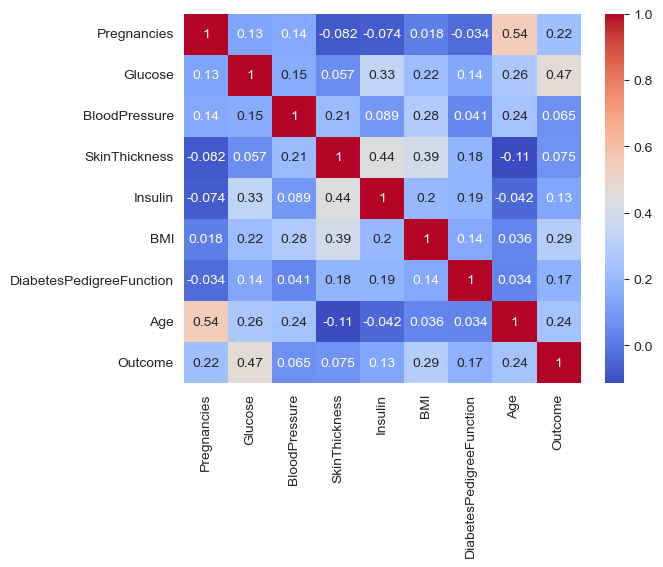

In [7]:
corrmat=df.corr()
sns.heatmap(corrmat, annot=True,cmap='coolwarm')

# Preparing Data (Processing Data)

Creating a copy of the original data set so we can compare later on

In [8]:
df_prep=df.copy()

In [9]:
df_prep['Glucose']=df_prep['Glucose'].replace(0,df_prep['Glucose'].mean())
df_prep['BloodPressure']=df_prep['BloodPressure'].replace(0,df_prep['BloodPressure'].mean())
df_prep['SkinThickness']=df_prep['SkinThickness'].replace(0,df_prep['SkinThickness'].median())
df_prep['Insulin']=df_prep['Insulin'].replace(0,df_prep['Insulin'].median())
df_prep['BMI']=df_prep['BMI'].replace(0,df_prep['BMI'].mean())

<function matplotlib.pyplot.show(close=None, block=None)>

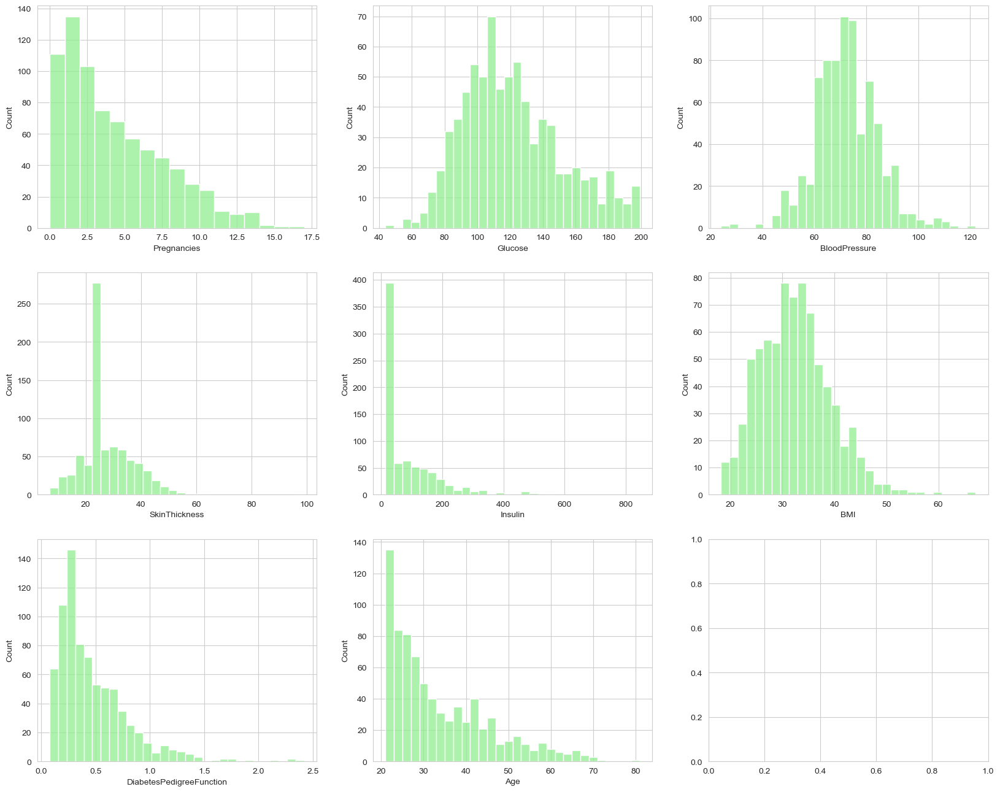

In [10]:
plt.figure(figsize=(20,16))
plt.subplot(3,3,1)
ax = sns.histplot(df_prep['Pregnancies'], bins=17, stat="count", color="lightgreen")
plt.subplot(3,3,2)


ax = sns.histplot(df_prep['Glucose'],  bins=30, stat="count",  color="lightgreen")
plt.subplot(3,3,3)



ax = sns.histplot(df_prep['BloodPressure'],  bins=30, stat="count",  color="lightgreen")
plt.subplot(3,3,4)


ax = sns.histplot(df_prep['SkinThickness'],  bins=30, stat="count", color="lightgreen")
plt.subplot(3,3,5)


ax = sns.histplot(df_prep['Insulin'],  bins=30, stat="count",  color="lightgreen")
plt.subplot(3,3,6)

ax = sns.histplot(df_prep['BMI'], bins=30, stat="count",  color="lightgreen")
plt.subplot(3,3,7)

ax = sns.histplot(df_prep['DiabetesPedigreeFunction'],  bins=30, stat="count", color="lightgreen")
plt.subplot(3,3,8)

ax = sns.histplot(df_prep['Age'], bins=30, stat="count",  color="lightgreen")
plt.subplot(3,3,9)



plt.show


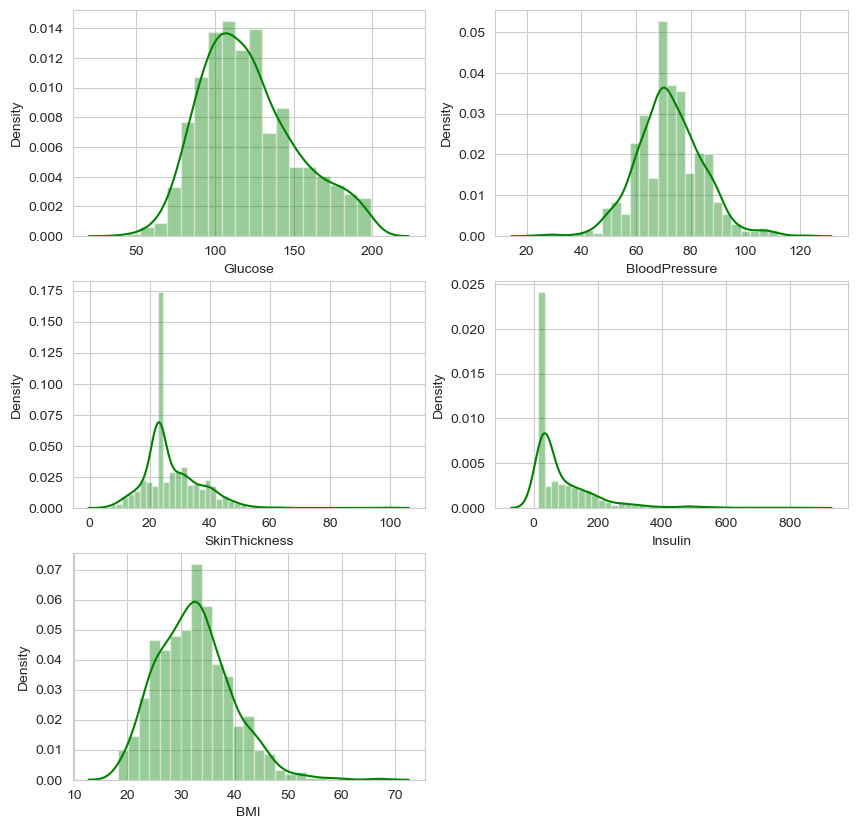

In [11]:
plt.figure(figsize=(10,10))
plt.subplot(3,2,1)

ax=sns.distplot(df_prep['Glucose'], color ="green")
plt.subplot(3,2,2)

ax = sns.distplot(df_prep['BloodPressure'], color ="green")
plt.subplot(3,2,3)

ax = sns.distplot(df_prep['SkinThickness'], color ="green")
plt.subplot(3,2,4)


ax = sns.distplot(df_prep['Insulin'], color ="green")
plt.subplot(3,2,5)


ax = sns.distplot(df_prep['BMI'], color ="green")

plt.show()


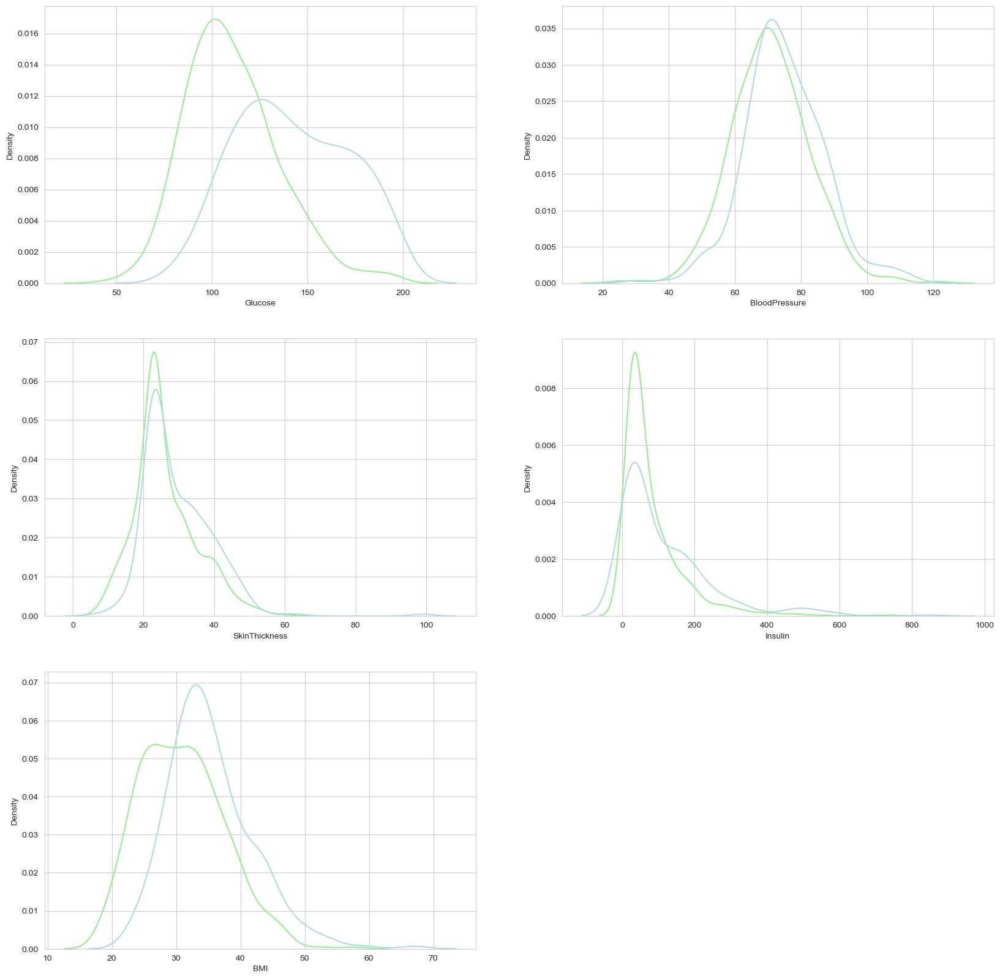

In [12]:
plt.figure(figsize=(20,20))

plt.subplot(3,2,1)
ax = sns.distplot(df_prep[df_prep['Outcome'] == 0]['Glucose'], color='lightgreen', hist=False, kde=True)
ax = sns.distplot(df_prep[df_prep['Outcome'] == 1]['Glucose'], color='lightblue', hist=False, kde=True)

plt.subplot(3,2,2)
ax = sns.distplot(df_prep[df_prep['Outcome'] == 0]['BloodPressure'], color='lightgreen', hist=False, kde=True)
ax = sns.distplot(df_prep[df_prep['Outcome'] == 1]['BloodPressure'], color='lightblue', hist=False, kde=True)

plt.subplot(3,2,3)
ax = sns.distplot(df_prep[df_prep['Outcome'] == 0]['SkinThickness'], color='lightgreen', hist=False, kde=True)
ax = sns.distplot(df_prep[df_prep['Outcome'] == 1]['SkinThickness'], color='lightblue', hist=False, kde=True)

plt.subplot(3,2,4)
ax = sns.distplot(df_prep[df_prep['Outcome'] == 0]['Insulin'], color='lightgreen', hist=False, kde=True)
ax = sns.distplot(df_prep[df_prep['Outcome'] == 1]['Insulin'], color='lightblue', hist=False, kde=True)

plt.subplot(3,2,5)
ax = sns.distplot(df_prep[df_prep['Outcome'] == 0]['BMI'], color='lightgreen', hist=False, kde=True)
ax = sns.distplot(df_prep[df_prep['Outcome'] == 1]['BMI'], color='lightblue', hist=False, kde=True)

plt.show()


<Axes: xlabel='DiabetesPedigreeFunction'>

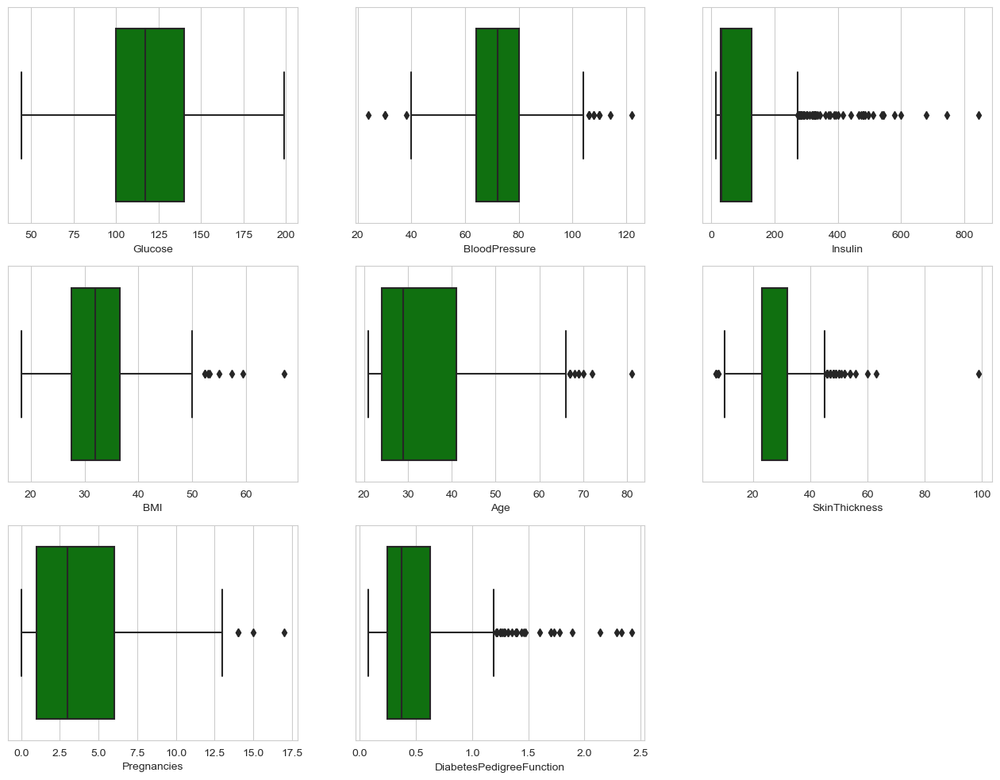

In [13]:
plt.figure(figsize=(16,12))
sns.set_style(style='whitegrid')
plt.subplot(3,3,1)
sns.boxplot(x='Glucose',data=df_prep,color="green")
plt.subplot(3,3,2)
sns.boxplot(x='BloodPressure',data=df_prep,color="green")
plt.subplot(3,3,3)
sns.boxplot(x='Insulin',data=df_prep,color="green")
plt.subplot(3,3,4)
sns.boxplot(x='BMI',data=df_prep,color="green")
plt.subplot(3,3,5)
sns.boxplot(x='Age',data=df_prep,color="green")
plt.subplot(3,3,6)
sns.boxplot(x='SkinThickness',data=df_prep,color="green")
plt.subplot(3,3,7)
sns.boxplot(x='Pregnancies',data=df_prep,color="green")
plt.subplot(3,3,8)
sns.boxplot(x='DiabetesPedigreeFunction',data=df_prep,color="green")


<Axes: xlabel='SkinThickness'>

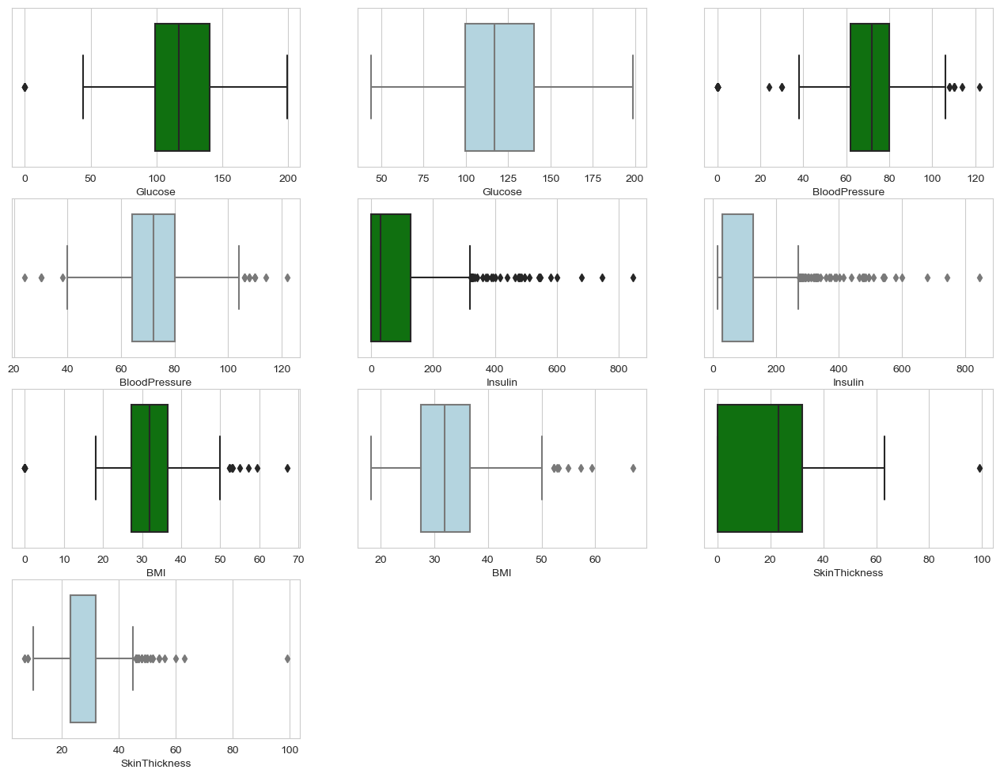

In [14]:
plt.figure(figsize=(16,12))
sns.set_style(style='whitegrid')
plt.subplot(4,3,1)
sns.boxplot(x='Glucose',data=df,color="green")
plt.subplot(4,3,2)
sns.boxplot(x='Glucose',data=df_prep,color="lightblue")
plt.subplot(4,3,3)
sns.boxplot(x='BloodPressure',data=df,color="green")
plt.subplot(4,3,4)
sns.boxplot(x='BloodPressure',data=df_prep,color="lightblue")
plt.subplot(4,3,5)
sns.boxplot(x='Insulin',data=df,color="green")
plt.subplot(4,3,6)
sns.boxplot(x='Insulin',data=df_prep,color="lightblue")
plt.subplot(4,3,7)
sns.boxplot(x='BMI',data=df,color="green")
plt.subplot(4,3,8)
sns.boxplot(x='BMI',data=df_prep,color="lightblue")
plt.subplot(4,3,9)
sns.boxplot(x='SkinThickness',data=df,color="green")
plt.subplot(4,3,10)
sns.boxplot(x='SkinThickness',data=df_prep,color="lightblue")

<Axes: >

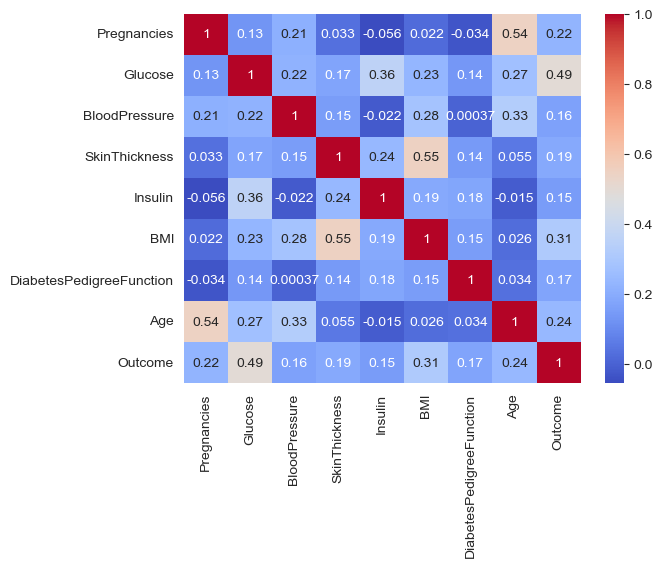

In [15]:
corrmat=df_prep.corr()
sns.heatmap(corrmat, annot=True,cmap="coolwarm")

# Fetrure Selection


In [22]:
df_new=df_prep.copy()
df_new_dropped=df_prep.drop(['BloodPressure','Insulin','SkinThickness','DiabetesPedigreeFunction'],axis='columns')

# Splitting the data


In [23]:
y=df_new['Outcome']
x=df_new.drop('Outcome',axis=1)
y_drop=df_new_dropped['Outcome']
x_drop=df_new_dropped.drop('Outcome',axis=1)

In [24]:
x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=0.2,random_state=0)
x_drop_train,x_drop_test,y_drop_train,y_drop_test= train_test_split(x_drop,y_drop,test_size=0.2,random_state=0)


# Naive Bayes


In [25]:
param_grid_nb = {
    'var_smoothing': np.logspace(-10, 10, num=1000)
}
nbModel_grid_nb_normal = GridSearchCV(estimator=GaussianNB(), param_grid=param_grid_nb, verbose=1, cv=10, n_jobs=-1,scoring="f1")
nbModel_grid_nb_split = GridSearchCV(estimator=GaussianNB(), param_grid=param_grid_nb, verbose=1, cv=10, n_jobs=-1,scoring="f1")


# Normal


In [26]:
nb_normal_model= nbModel_grid_nb_normal.fit(x_train, y_train)
nb_normal=nb_normal_model.predict(x_test)
print(nb_normal_model.best_params_)

Fitting 10 folds for each of 1000 candidates, totalling 10000 fits
{'var_smoothing': 1.7589165903277326e-05}


In [27]:
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train),
    feature_names=x_train.columns,
    class_names=['No Diabetes', 'Diabetes'],
    mode='classification'
)

exp = explainer.explain_instance(
    data_row=x_test.iloc[1], 
    predict_fn=nb_normal_model.predict_proba
)

exp.show_in_notebook(show_table=True)

Classification Report is:
               precision    recall  f1-score   support

Not Diabetes       0.84      0.87      0.85       107
    Diabetes       0.67      0.62      0.64        47

    accuracy                           0.79       154
   macro avg       0.76      0.74      0.75       154
weighted avg       0.79      0.79      0.79       154


F1 score is: 0.6444444444444444

Precision score is: 0.6744186046511628

Recall score is: 0.6170212765957447


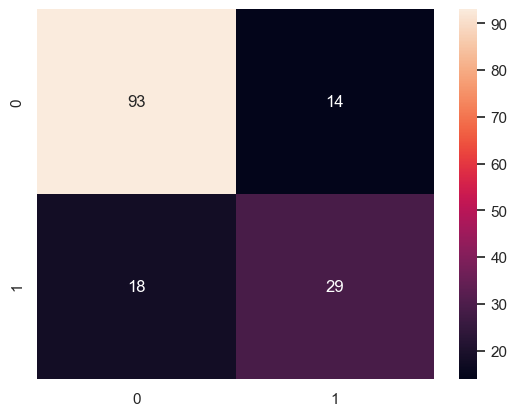

In [28]:
nb_normal_report = classification_report(y_test, nb_normal,target_names=["Not Diabetes", "Diabetes"])
nb_normal_f1 = f1_score(y_test, nb_normal)
nb_normal_precision = precision_score(y_test, nb_normal)
nb_normal_recall = recall_score(y_test, nb_normal)
nb_normal_cm = confusion_matrix(y_test, nb_normal)

print("Classification Report is:\n", nb_normal_report)
print("\nF1 score is:", nb_normal_f1)
print("\nPrecision score is:", nb_normal_precision)
print("\nRecall score is:", nb_normal_recall)

sns.set(font_scale=1)
sns.heatmap(nb_normal_cm, annot=True)
plt.show()

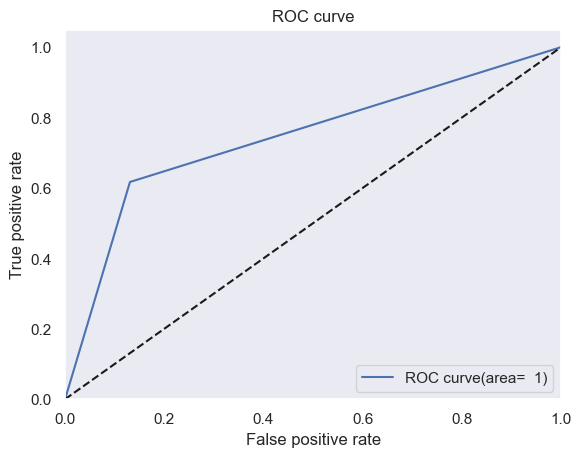

In [29]:
fpr,tpr,_=roc_curve(y_test, nb_normal)
#calculate AUC
roc_auc=auc(fpr,tpr)
#plot of ROC curve for a specified class
plt.figure()
plt.plot(fpr,tpr,label='ROC curve(area= %2.f)' %roc_auc)
plt.plot([0,1],[0,1],'k--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Split


In [30]:
nb_split_model= nbModel_grid_nb_split.fit(x_drop_train, y_drop_train)
nb_split_pred=nb_split_model.predict(x_drop_test)
print(nb_split_model.best_params_)

Fitting 10 folds for each of 1000 candidates, totalling 10000 fits
{'var_smoothing': 0.006424033659394191}


In [31]:
explainer= lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_drop_train),
    feature_names=x_drop_train.columns,
    class_names=['No Diabetes', 'Diabetes'],
    mode='classification'
)

exp = explainer.explain_instance(
    data_row=x_drop_test.iloc[1], 
    predict_fn=nb_split_model.predict_proba
)

exp.show_in_notebook(show_table=True)

Classification Report is:
               precision    recall  f1-score   support

Not Diabetes       0.83      0.89      0.86       107
    Diabetes       0.69      0.57      0.63        47

    accuracy                           0.79       154
   macro avg       0.76      0.73      0.74       154
weighted avg       0.79      0.79      0.79       154


F1 score is: 0.627906976744186

Precision score is: 0.6923076923076923

Recall score is: 0.574468085106383


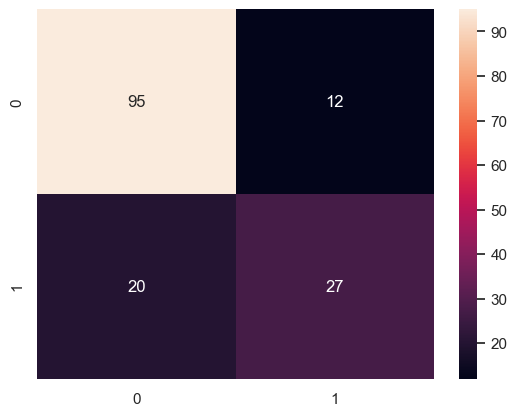

In [32]:
nb_pred_report = classification_report(y_test, nb_split_pred,target_names=["Not Diabetes", "Diabetes"])
nb_pred_f1 = f1_score(y_test, nb_split_pred)
nb_pred_precision = precision_score(y_test, nb_split_pred)
nb_pred_recall = recall_score(y_test, nb_split_pred)
nb_pred_cm = confusion_matrix(y_test, nb_split_pred)

print("Classification Report is:\n", nb_pred_report)
print("\nF1 score is:", nb_pred_f1)
print("\nPrecision score is:", nb_pred_precision)
print("\nRecall score is:", nb_pred_recall)

sns.set(font_scale=1)
sns.heatmap(nb_pred_cm, annot=True)
plt.show()

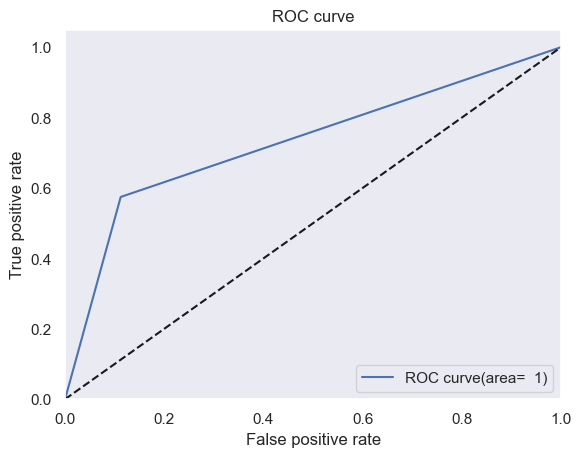

In [33]:
fpr,tpr,_=roc_curve(y_test, nb_split_pred)
#calculate AUC
roc_auc=auc(fpr,tpr)
#plot of ROC curve for a specified class
plt.figure()
plt.plot(fpr,tpr,label='ROC curve(area= %2.f)' %roc_auc)
plt.plot([0,1],[0,1],'k--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Decision Tree


In [34]:
dt = DecisionTreeClassifier(random_state=42)

params = {
    'max_depth': [5,10,20,25,30,35,40,45],
    'min_samples_leaf': [10,20,50,100,120,150,200,250],
    'criterion': ["gini", "entropy"]
}

grid_search_dt_normal = GridSearchCV(estimator=dt,  param_grid=params,  cv=4, n_jobs=-1, verbose=1, scoring = "f1")

grid_search_dt_split = GridSearchCV(estimator=dt, param_grid=params, cv=4, n_jobs=-1, verbose=1, scoring = "f1")


# Normal


In [35]:
dt_normal_model=grid_search_dt_normal.fit(x_train, y_train)
dt_normal_pred=dt_normal_model.predict(x_test)
print(dt_normal_model.best_params_)

Fitting 4 folds for each of 128 candidates, totalling 512 fits
{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 200}


In [36]:
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train),
    feature_names=x_train.columns,
    class_names=['No Diabetes', 'Diabetes'],
    mode='classification'
)

exp = explainer.explain_instance(
    data_row=x_test.iloc[1], 
    predict_fn=dt_normal_model.predict_proba
)

exp.show_in_notebook(show_table=True)

Classification Report is:
               precision    recall  f1-score   support

Not Diabetes       0.84      0.74      0.79       107
    Diabetes       0.53      0.68      0.60        47

    accuracy                           0.72       154
   macro avg       0.69      0.71      0.69       154
weighted avg       0.75      0.72      0.73       154


F1 score is: 0.5981308411214953

Precision score is: 0.5333333333333333

Recall score is: 0.6808510638297872


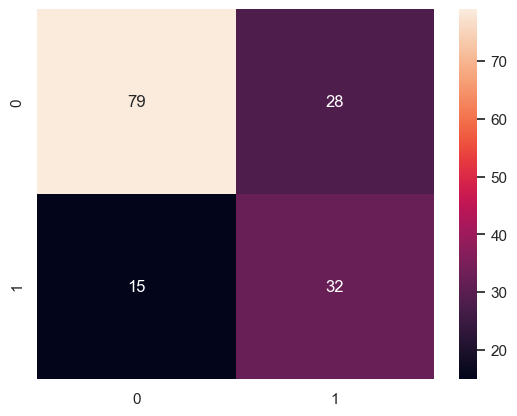

In [37]:
dt_normal_report = classification_report(y_test, dt_normal_pred,target_names=["Not Diabetes", "Diabetes"])
dt_normal_f1 = f1_score(y_test, dt_normal_pred)
dt_normal_precision = precision_score(y_test, dt_normal_pred)
dt_normal_recall = recall_score(y_test, dt_normal_pred)
dt_normal_cm = confusion_matrix(y_test, dt_normal_pred)

print("Classification Report is:\n", dt_normal_report)
print("\nF1 score is:", dt_normal_f1)
print("\nPrecision score is:", dt_normal_precision)
print("\nRecall score is:", dt_normal_recall)

sns.set(font_scale=1)
sns.heatmap(dt_normal_cm, annot=True)
plt.show()

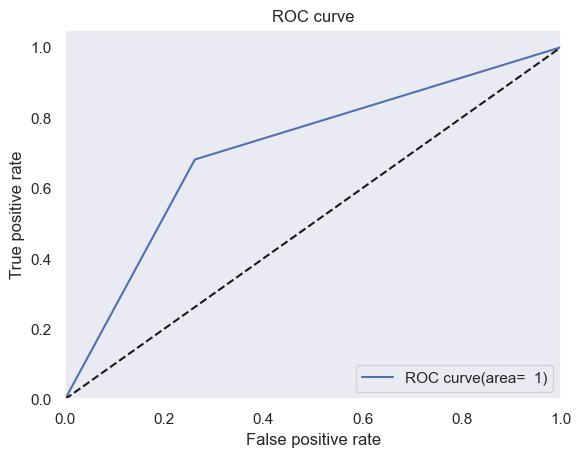

In [38]:
fpr,tpr,_=roc_curve(y_test, dt_normal_pred)
#calculate AUC
roc_auc=auc(fpr,tpr)
#plot of ROC curve for a specified class
plt.figure()
plt.plot(fpr,tpr,label='ROC curve(area= %2.f)' %roc_auc)
plt.plot([0,1],[0,1],'k--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Split

In [39]:
dt_split_model=grid_search_dt_split.fit(x_drop_train, y_drop_train)
dt_split_pred=dt_split_model.predict(x_drop_test)
print(dt_split_model.best_params_)

Fitting 4 folds for each of 128 candidates, totalling 512 fits
{'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 20}


In [40]:
explainer= lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_drop_train),
    feature_names=x_drop_train.columns,
    class_names=['No Diabetes', 'Diabetes'],
    mode='classification'
)

exp = explainer.explain_instance(
    data_row=x_drop_test.iloc[1], 
    predict_fn=dt_split_model.predict_proba
)

exp.show_in_notebook(show_table=True)

Classification Report is:
               precision    recall  f1-score   support

Not Diabetes       0.86      0.88      0.87       107
    Diabetes       0.71      0.68      0.70        47

    accuracy                           0.82       154
   macro avg       0.79      0.78      0.78       154
weighted avg       0.82      0.82      0.82       154


F1 score is: 0.5981308411214953

Precision score is: 0.7111111111111111

Recall score is: 0.6808510638297872


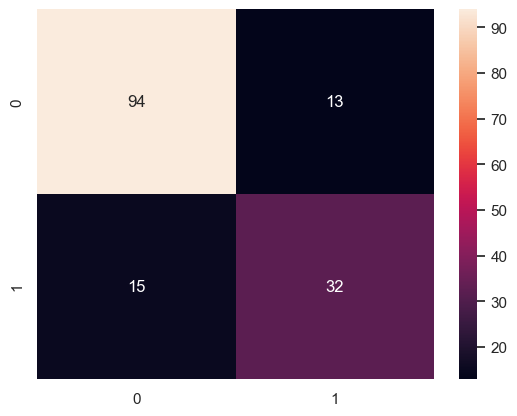

In [41]:
dt_split_report = classification_report(y_test, dt_split_pred,target_names=["Not Diabetes", "Diabetes"])
dt_split_f1 = f1_score(y_test, dt_normal_pred)
dt_split_precision = precision_score(y_test, dt_split_pred)
dt_split_recall = recall_score(y_test, dt_split_pred)
dt_split_cm = confusion_matrix(y_test, dt_split_pred)

print("Classification Report is:\n", dt_split_report)
print("\nF1 score is:", dt_split_f1)
print("\nPrecision score is:", dt_split_precision)
print("\nRecall score is:", dt_split_recall)

sns.set(font_scale=1)
sns.heatmap(dt_split_cm, annot=True)
plt.show()

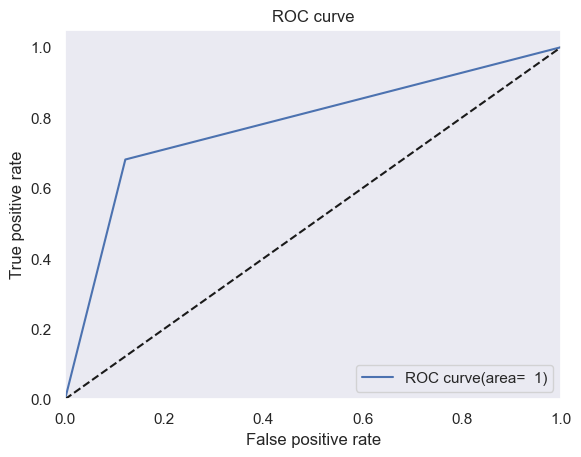

In [42]:
fpr,tpr,_=roc_curve(y_test, dt_split_pred)
#calculate AUC
roc_auc=auc(fpr,tpr)
#plot of ROC curve for a specified class
plt.figure()
plt.plot(fpr,tpr,label='ROC curve(area= %2.f)' %roc_auc)
plt.plot([0,1],[0,1],'k--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# KNN

In [43]:

knn= KNeighborsClassifier()
n_neighbors = list(range(15,25))
p=[1,2,3]
weights = ['uniform', 'distance']
metric = ['euclidean', 'manhattan', 'minkowski','correlation','cosine']

hyperparameters = dict(n_neighbors=n_neighbors, p=p,weights=weights,metric=metric)

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=0)
grid_search_knn_normal = GridSearchCV(estimator=knn, param_grid=hyperparameters, n_jobs=-1, cv=cv, scoring='f1',error_score=0)
grid_search_knn_split = GridSearchCV(estimator=knn, param_grid=hyperparameters, n_jobs=-1, cv=cv, scoring='f1',error_score=0)

# Normal


In [44]:
knn_normal_model = grid_search_knn_normal.fit(x_train,y_train)
knn_normal_pred = knn_normal_model.predict(x_test)
print(knn_normal_model.best_params_)

{'metric': 'manhattan', 'n_neighbors': 19, 'p': 1, 'weights': 'distance'}


In [45]:
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train),
    feature_names=x_train.columns,
    class_names=['No Diabetes', 'Diabetes'],
    mode='classification'
)

exp = explainer.explain_instance(
    data_row=x_test.iloc[1], 
    predict_fn=knn_normal_model.predict_proba
)

exp.show_in_notebook(show_table=True)

Classification Report is:
               precision    recall  f1-score   support

Not Diabetes       0.81      0.84      0.83       107
    Diabetes       0.60      0.55      0.58        47

    accuracy                           0.75       154
   macro avg       0.71      0.70      0.70       154
weighted avg       0.75      0.75      0.75       154


F1 score is: 0.5777777777777778

Precision score is: 0.6046511627906976

Recall score is: 0.5531914893617021


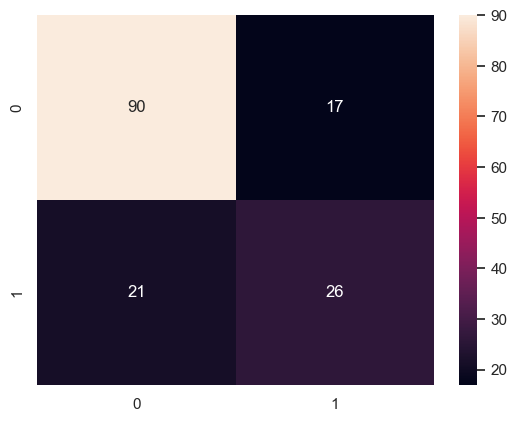

In [46]:
knn_normal_report = classification_report(y_test, knn_normal_pred,target_names=["Not Diabetes", "Diabetes"])
knn_normal_f1 = f1_score(y_test, knn_normal_pred)
knn_normal_precision = precision_score(y_test, knn_normal_pred)
knn_normal_recall = recall_score(y_test, knn_normal_pred)
knn_normal_cm = confusion_matrix(y_test, knn_normal_pred)

print("Classification Report is:\n", knn_normal_report)
print("\nF1 score is:", knn_normal_f1)
print("\nPrecision score is:", knn_normal_precision)
print("\nRecall score is:",knn_normal_recall)

sns.set(font_scale=1)
sns.heatmap(knn_normal_cm, annot=True)
plt.show()

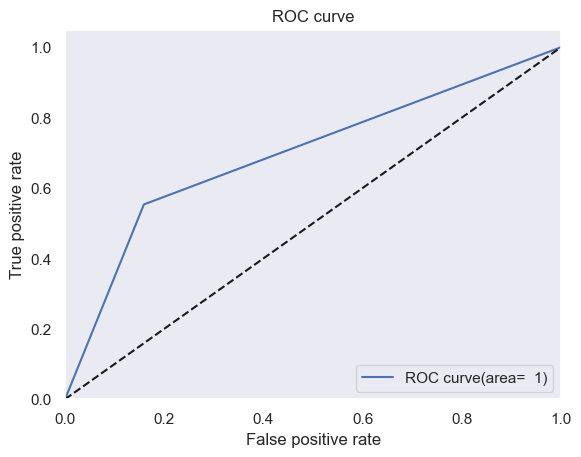

In [47]:
fpr,tpr,_=roc_curve(y_test, knn_normal_pred)
#calculate AUC
roc_auc=auc(fpr,tpr)
#plot of ROC curve for a specified class
plt.figure()
plt.plot(fpr,tpr,label='ROC curve(area= %2.f)' %roc_auc)
plt.plot([0,1],[0,1],'k--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Split


In [48]:
knn_split_model = grid_search_knn_split.fit(x_drop_train,y_drop_train)
knn_split_pred = knn_split_model.predict(x_drop_test)
print(knn_split_model.best_params_)

{'metric': 'euclidean', 'n_neighbors': 24, 'p': 1, 'weights': 'distance'}


In [49]:
explainer= lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_drop_train),
    feature_names=x_drop_train.columns,
    class_names=['No Diabetes', 'Diabetes'],
    mode='classification'
)

exp = explainer.explain_instance(
    data_row=x_drop_test.iloc[1], 
    predict_fn=knn_split_model.predict_proba
)

exp.show_in_notebook(show_table=True)

Classification Report is:
               precision    recall  f1-score   support

Not Diabetes       0.84      0.87      0.85       107
    Diabetes       0.67      0.62      0.64        47

    accuracy                           0.79       154
   macro avg       0.76      0.74      0.75       154
weighted avg       0.79      0.79      0.79       154


F1 score is: 0.6444444444444444

Precision score is: 0.6744186046511628

Recall score is: 0.6170212765957447


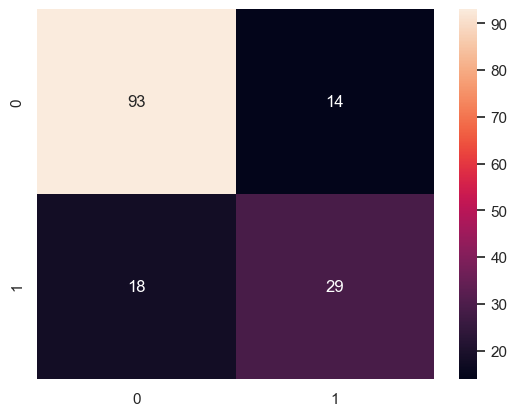

In [50]:
knn_split_report = classification_report(y_test, knn_split_pred,target_names=["Not Diabetes", "Diabetes"])
knn_split_f1 = f1_score(y_test, knn_split_pred)
knn_split_precision = precision_score(y_test, knn_split_pred)
knn_split_recall = recall_score(y_test, knn_split_pred)
knn_split_cm = confusion_matrix(y_test, knn_split_pred)

print("Classification Report is:\n", knn_split_report)
print("\nF1 score is:", knn_split_f1)
print("\nPrecision score is:", knn_split_precision)
print("\nRecall score is:", knn_split_recall)

sns.set(font_scale=1)
sns.heatmap(knn_split_cm, annot=True)
plt.show()

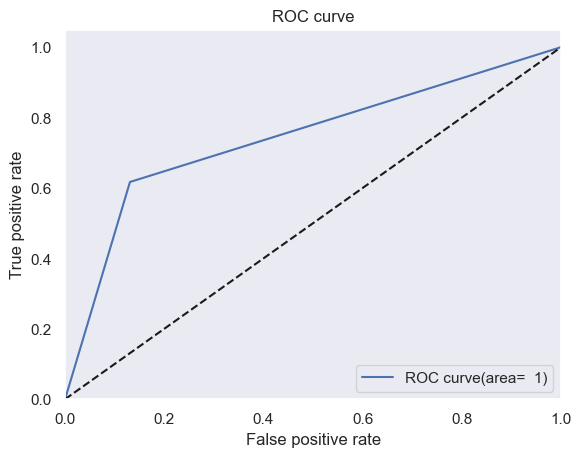

In [51]:
fpr,tpr,_=roc_curve(y_test, knn_split_pred)
#calculate AUC
roc_auc=auc(fpr,tpr)
#plot of ROC curve for a specified class
plt.figure()
plt.plot(fpr,tpr,label='ROC curve(area= %2.f)' %roc_auc)
plt.plot([0,1],[0,1],'k--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Random Forest

In [52]:
model = RandomForestClassifier()
n_estimators = [1800,2000,2500]
max_features = ['sqrt', 'log2']

grid = dict(n_estimators=n_estimators,max_features=max_features)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=0)
grid_search_rf_normal = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='f1',error_score=0)
grid_search_rf_split = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='f1',error_score=0)

# Normal


In [53]:
rf_normal_model = grid_search_rf_normal.fit(x_train, y_train)
rf_normal_pred=rf_normal_model.predict(x_test)
print(rf_normal_model.best_params_)

{'max_features': 'log2', 'n_estimators': 1800}


In [54]:
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train),
    feature_names=x_train.columns,
    class_names=['No Diabetes', 'Diabetes'],
    mode='classification'
)

exp = explainer.explain_instance(
    data_row=x_test.iloc[1], 
    predict_fn=rf_normal_model.predict_proba
)

exp.show_in_notebook(show_table=True)

Classification Report is:
               precision    recall  f1-score   support

Not Diabetes       0.86      0.87      0.87       107
    Diabetes       0.70      0.68      0.69        47

    accuracy                           0.81       154
   macro avg       0.78      0.78      0.78       154
weighted avg       0.81      0.81      0.81       154


F1 score is: 0.6881720430107526

Precision score is: 0.6956521739130435

Recall score is: 0.6808510638297872


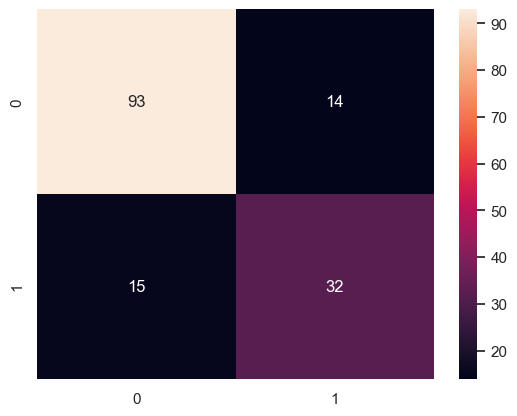

In [55]:
rf_normal_report = classification_report(y_test, rf_normal_pred,target_names=["Not Diabetes", "Diabetes"])
rf_normal_f1 = f1_score(y_test, rf_normal_pred)
rf_normal_precision = precision_score(y_test, rf_normal_pred)
rf_normal_recall = recall_score(y_test, rf_normal_pred)
rf_normal_cm = confusion_matrix(y_test, rf_normal_pred)

print("Classification Report is:\n", rf_normal_report)
print("\nF1 score is:", rf_normal_f1)
print("\nPrecision score is:", rf_normal_precision)
print("\nRecall score is:",rf_normal_recall)

sns.set(font_scale=1)
sns.heatmap(rf_normal_cm, annot=True)
plt.show()

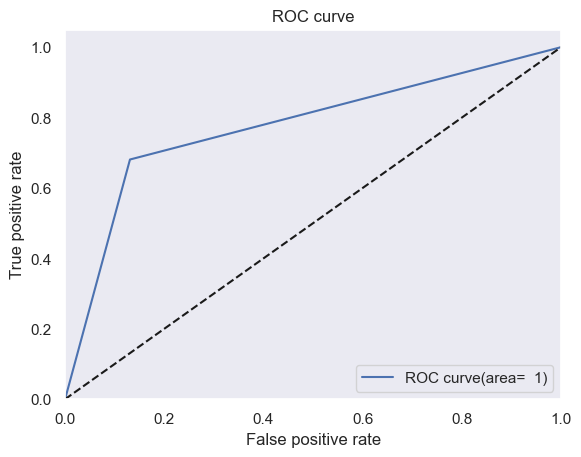

In [56]:
fpr,tpr,_=roc_curve(y_test, rf_normal_pred)
#calculate AUC
roc_auc=auc(fpr,tpr)
#plot of ROC curve for a specified class
plt.figure()
plt.plot(fpr,tpr,label='ROC curve(area= %2.f)' %roc_auc)
plt.plot([0,1],[0,1],'k--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Split


In [57]:
rf_split_model = grid_search_rf_split.fit(x_drop_train, y_drop_train)
rf_split_pred=rf_split_model.predict(x_drop_test)
print(rf_split_model.best_params_)

{'max_features': 'sqrt', 'n_estimators': 2500}


In [58]:
explainer= lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_drop_train),
    feature_names=x_drop_train.columns,
    class_names=['No Diabetes', 'Diabetes'],
    mode='classification'
)

exp = explainer.explain_instance(
    data_row=x_drop_test.iloc[1], 
    predict_fn=rf_split_model.predict_proba
)

exp.show_in_notebook(show_table=True)

Classification Report is:
               precision    recall  f1-score   support

Not Diabetes       0.86      0.85      0.85       107
    Diabetes       0.67      0.68      0.67        47

    accuracy                           0.80       154
   macro avg       0.76      0.77      0.76       154
weighted avg       0.80      0.80      0.80       154


F1 score is: 0.6736842105263158

Precision score is: 0.6666666666666666

Recall score is: 0.6808510638297872


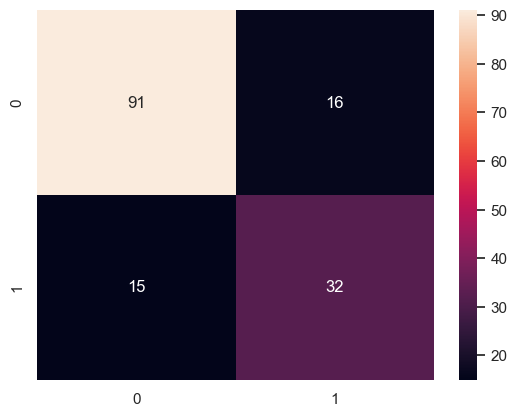

In [59]:
rf_split_report = classification_report(y_test, rf_split_pred,target_names=["Not Diabetes", "Diabetes"])
rf_split_f1 = f1_score(y_test, rf_split_pred)
rf_split_precision = precision_score(y_test, rf_split_pred)
rf_split_recall = recall_score(y_test, rf_split_pred)
rf_split_cm = confusion_matrix(y_test, rf_split_pred)

print("Classification Report is:\n", rf_split_report)
print("\nF1 score is:", rf_split_f1)
print("\nPrecision score is:", rf_split_precision)
print("\nRecall score is:", rf_split_recall)

sns.set(font_scale=1)
sns.heatmap(rf_split_cm, annot=True)
plt.show()

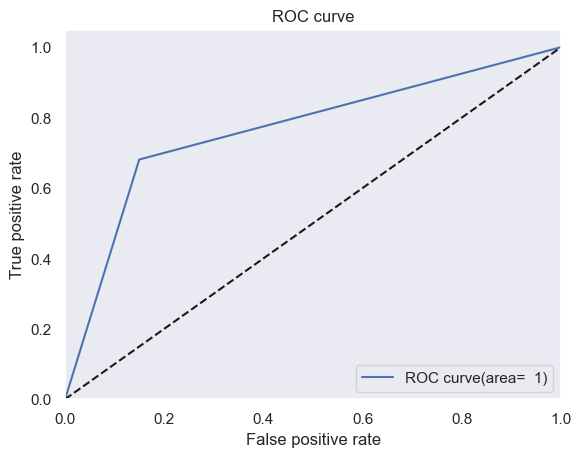

In [60]:
fpr,tpr,_=roc_curve(y_test, rf_split_pred)
#calculate AUC
roc_auc=auc(fpr,tpr)
#plot of ROC curve for a specified class
plt.figure()
plt.plot(fpr,tpr,label='ROC curve(area= %2.f)' %roc_auc)
plt.plot([0,1],[0,1],'k--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# SVM

In [61]:
model = SVC(probability=True)
kernel = ['poly', 'rbf', 'sigmoid']
C = [50, 10, 1.0, 0.1, 0.01]
gamma = ['scale']

# define grid search
grid = dict(kernel=kernel,C=C,gamma=gamma)
cv = RepeatedStratifiedKFold(n_splits=40, n_repeats=12, random_state=0)
grid_search_svm_normal = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='f1',error_score=0)
grid_search_svm_split = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='f1',error_score=0)

# Normal


In [62]:
svm_normal_model = grid_search_svm_normal.fit(x_train, y_train)
svm_normal_pred=svm_normal_model.predict(x_test)
print(svm_normal_model.best_params_)

{'C': 10, 'gamma': 'scale', 'kernel': 'poly'}


In [63]:
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train),
    feature_names=x_train.columns,
    class_names=['No Diabetes', 'Diabetes'],
    mode='classification'
)

exp = explainer.explain_instance(
    data_row=x_test.iloc[0], 
    predict_fn=svm_normal_model.predict_proba
)

exp.show_in_notebook(show_table=True)

Classification Report is:
               precision    recall  f1-score   support

Not Diabetes       0.82      0.93      0.87       107
    Diabetes       0.76      0.53      0.62        47

    accuracy                           0.81       154
   macro avg       0.79      0.73      0.75       154
weighted avg       0.80      0.81      0.79       154


F1 score is: 0.625

Precision score is: 0.7575757575757576

Recall score is: 0.5319148936170213


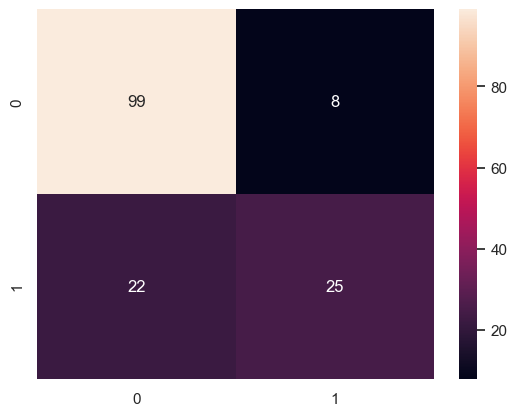

In [64]:
svm_normal_report = classification_report(y_test, svm_normal_pred,target_names=["Not Diabetes", "Diabetes"])
svm_normal_f1 = f1_score(y_test, svm_normal_pred)
svm_normal_precision = precision_score(y_test, svm_normal_pred)
svm_normal_recall = recall_score(y_test, svm_normal_pred)
svm_normal_cm = confusion_matrix(y_test, svm_normal_pred)

print("Classification Report is:\n", svm_normal_report)
print("\nF1 score is:", svm_normal_f1)
print("\nPrecision score is:", svm_normal_precision)
print("\nRecall score is:",svm_normal_recall)

sns.set(font_scale=1)
sns.heatmap(svm_normal_cm, annot=True)
plt.show()

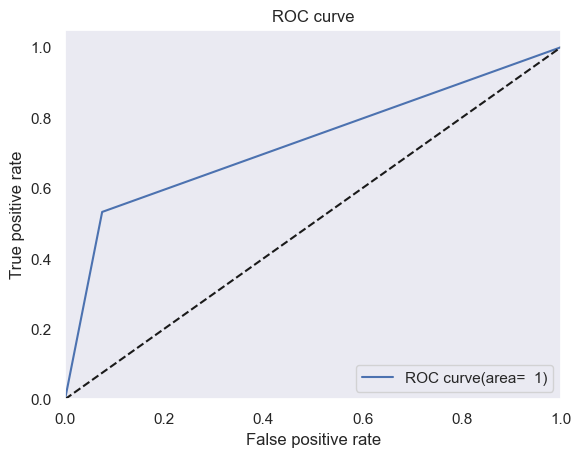

In [65]:
fpr,tpr,_=roc_curve(y_test, svm_normal_pred)
#calculate AUC
roc_auc=auc(fpr,tpr)
#plot of ROC curve for a specified class
plt.figure()
plt.plot(fpr,tpr,label='ROC curve(area= %2.f)' %roc_auc)
plt.plot([0,1],[0,1],'k--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Split


In [66]:
svm_split_model = grid_search_svm_split.fit(x_drop_train, y_drop_train)
svm_split_pred=svm_split_model.predict(x_drop_test)

In [67]:
explainer= lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_drop_train),
    feature_names=x_drop_train.columns,
    class_names=['No Diabetes', 'Diabetes'],
    mode='classification'
)

exp = explainer.explain_instance(
    data_row=x_drop_test.iloc[1], 
    predict_fn=svm_split_model.predict_proba
)

exp.show_in_notebook(show_table=True)

Classification Report is:
               precision    recall  f1-score   support

Not Diabetes       0.81      0.90      0.85       107
    Diabetes       0.69      0.53      0.60        47

    accuracy                           0.79       154
   macro avg       0.75      0.71      0.73       154
weighted avg       0.78      0.79      0.78       154


F1 score is: 0.6024096385542169

Precision score is: 0.6944444444444444

Recall score is: 0.5319148936170213


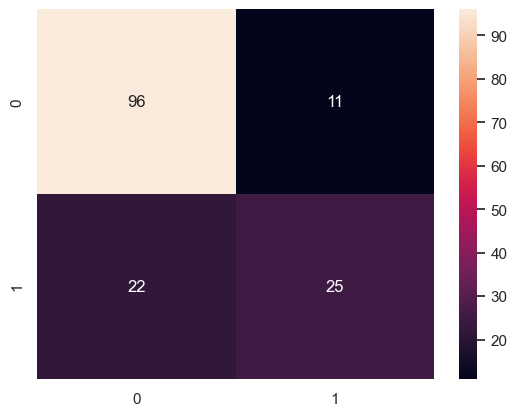

In [68]:
svm_split_report = classification_report(y_test, svm_split_pred,target_names=["Not Diabetes", "Diabetes"])
svm_split_f1 = f1_score(y_test, svm_split_pred)
svm_split_precision = precision_score(y_test, svm_split_pred)
svm_split_recall = recall_score(y_test, svm_split_pred)
svm_split_cm = confusion_matrix(y_test, svm_split_pred)

print("Classification Report is:\n", svm_split_report)
print("\nF1 score is:", svm_split_f1)
print("\nPrecision score is:", svm_split_precision)
print("\nRecall score is:", svm_split_recall)

sns.set(font_scale=1)
sns.heatmap(svm_split_cm, annot=True)
plt.show()

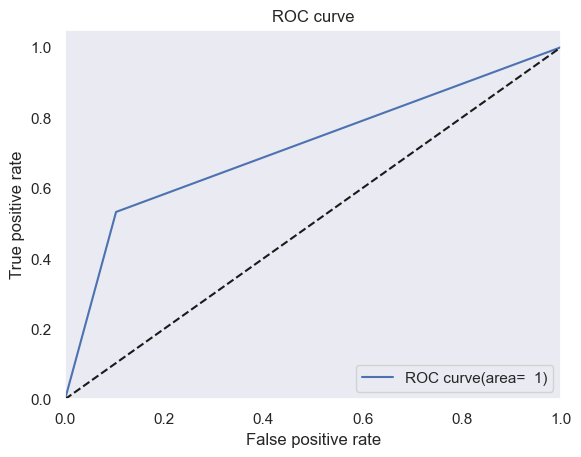

In [69]:
fpr,tpr,_=roc_curve(y_test, svm_split_pred)
#calculate AUC
roc_auc=auc(fpr,tpr)
#plot of ROC curve for a specified class
plt.figure()
plt.plot(fpr,tpr,label='ROC curve(area= %2.f)' %roc_auc)
plt.plot([0,1],[0,1],'k--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

# Model selection


In [71]:
final_model = RandomForestClassifier()
n_estimators = [2000]
max_features = ['sqrt']

cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=0)
grid = dict(n_estimators=n_estimators,max_features=max_features)

grid_search_rf= GridSearchCV(estimator=final_model, param_grid=grid, n_jobs=-1, cv=cv, scoring='f1',error_score=0)
df_final = df_prep[:-5].copy()
x_final = df_final.drop(columns=[df_final.columns[-1]]).copy()

y_final = df_final[df_final.columns[-1]].copy()


final_df_model=grid_search_rf.fit(x_final.values,y_final.values)


In [72]:
from joblib import dump

dump(final_df_model, 'Diabeties_model.joblib')
